# **Complex Steerable Pyramids**

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from test_image import *
from steerable_pyramid import SteerablePyramid

%matplotlib inline

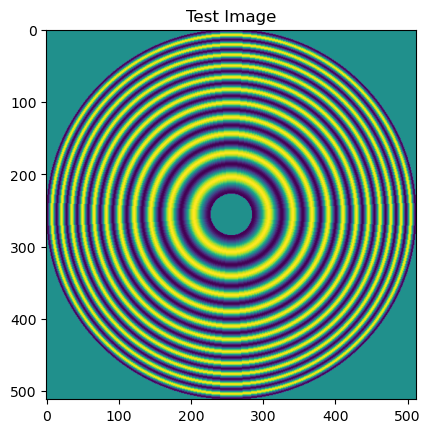

In [2]:
from skimage.data import camera

image = get_test_image(512, f1)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

# image = camera()

plt.imshow(image)
plt.title("Test Image");

## Get Complex Steerable Pyramid Class

In [73]:
cpyr = SteerablePyramid(depth=4, nbands=4, twidth=1, complex_pyr=True)

In [74]:
# get Steerable Pyramid Filters
filters, crops = cpyr.get_filters(image)

# get Steerable Pyramid Decomposition
pyramid = cpyr.build_pyramid(image, filters, crops)

# reconstruct original image DFT from pyramid decomposition
recon_dft = cpyr.reconstruct_image_dft(pyramid, filters, crops)

### Display Results

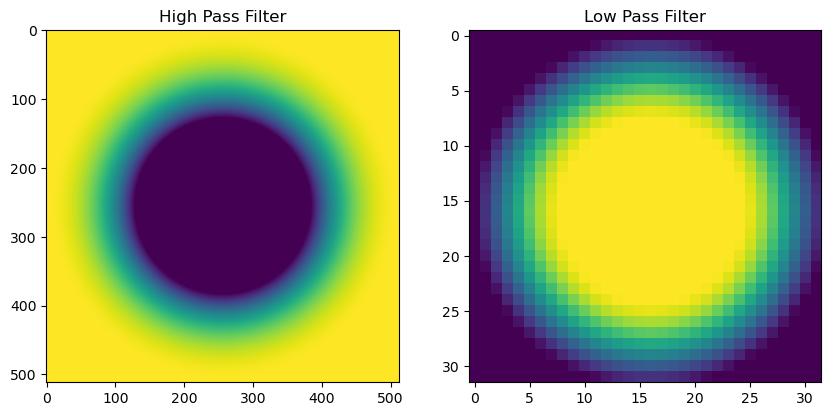

In [75]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(filters[0]);
ax[0].set_title("High Pass Filter");

ax[1].imshow(filters[-1]);
ax[1].set_title("Low Pass Filter");

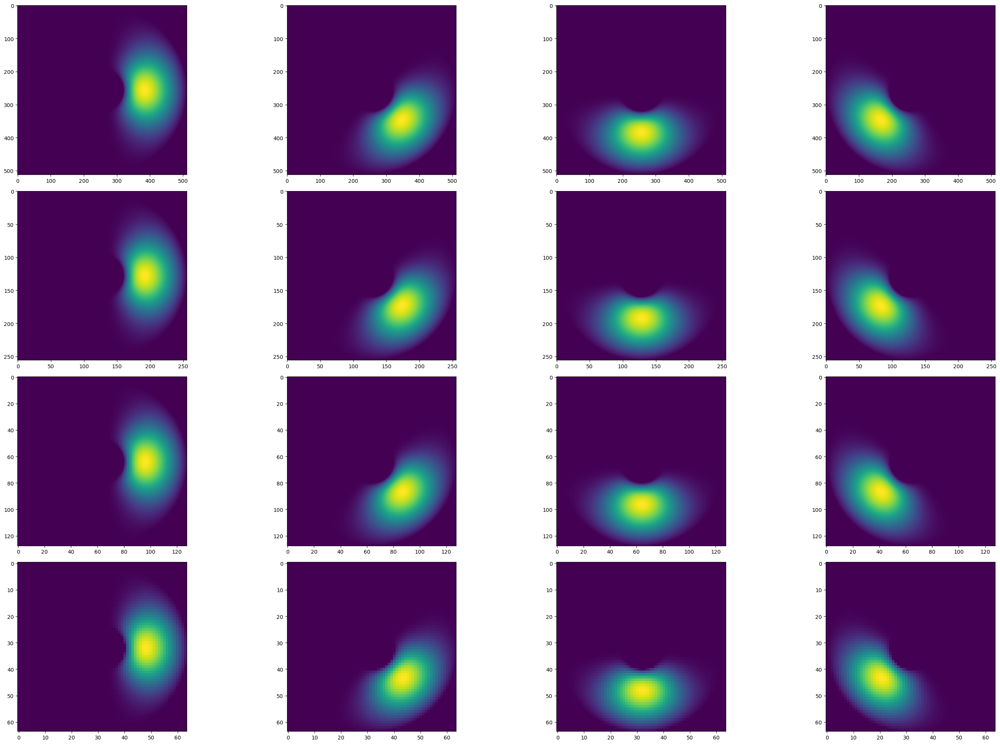

In [76]:
cpyr.display(filters);

Get Magnitude and Phase Pyramids for Display

In [77]:
magnitude_pyramid = [np.abs(pyr) for pyr in pyramid]
phase_pyramid = [np.angle(pyr) for pyr in pyramid]

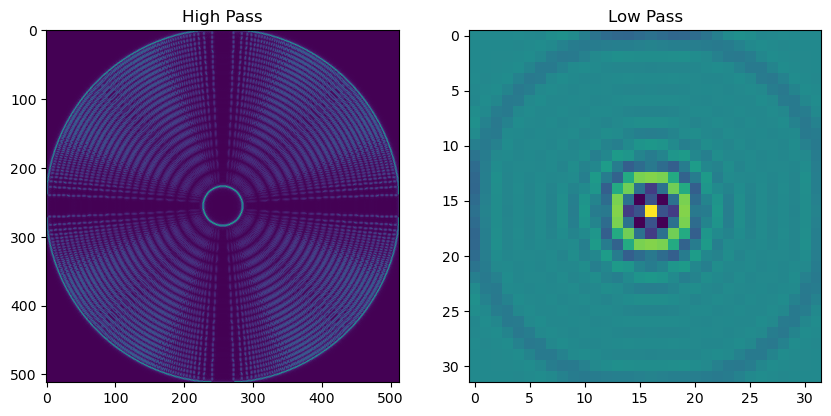

In [78]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.abs(pyramid[0]));
ax[0].set_title("High Pass");

ax[1].imshow(np.abs(pyramid[-1]));
ax[1].set_title("Low Pass");

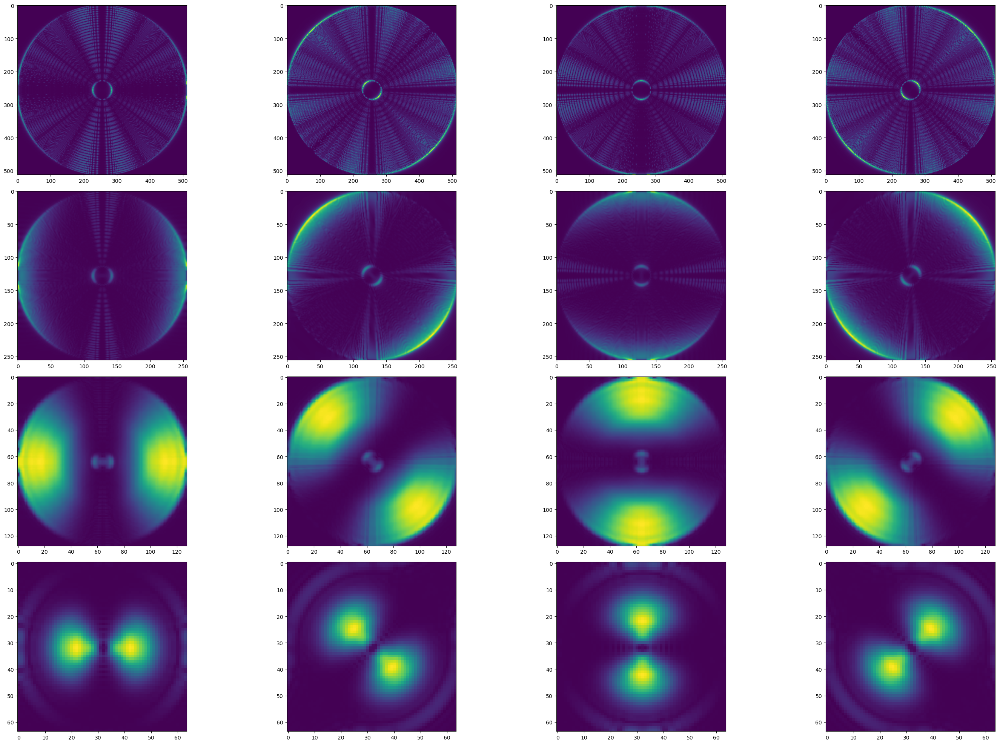

In [79]:
cpyr.display(magnitude_pyramid);

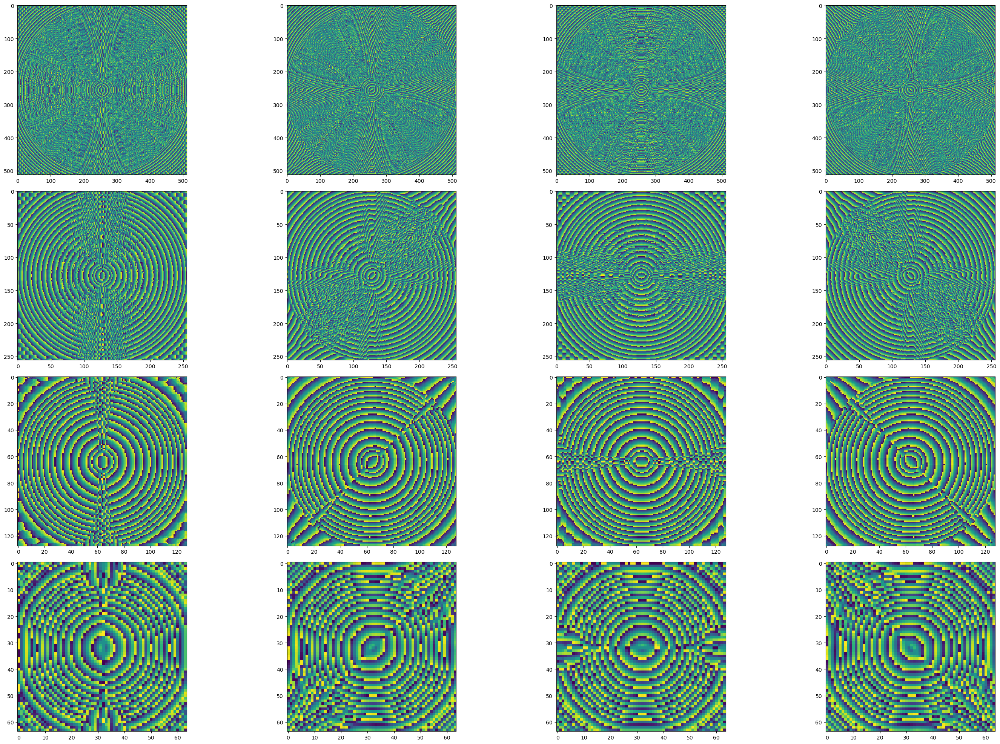

In [80]:
cpyr.display(phase_pyramid);

In [81]:
image_dft = np.fft.fftshift(np.fft.fft2(image))

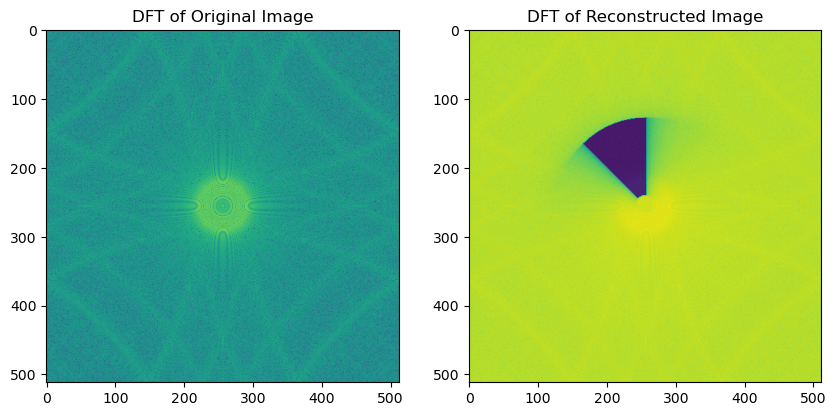

In [82]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.log(np.abs(image_dft)));
ax[0].set_title("DFT of Original Image");

ax[1].imshow(np.log(np.abs(recon_dft)));
ax[1].set_title("DFT of Reconstructed Image");

Notice the stark difference between the original and reocnstructed DFTs as compared to the regular steerable pyramid. We will see that the reconstruction from the complex steerable pyramid DFT still has all the information to obtain the original image

Get reconstructed image

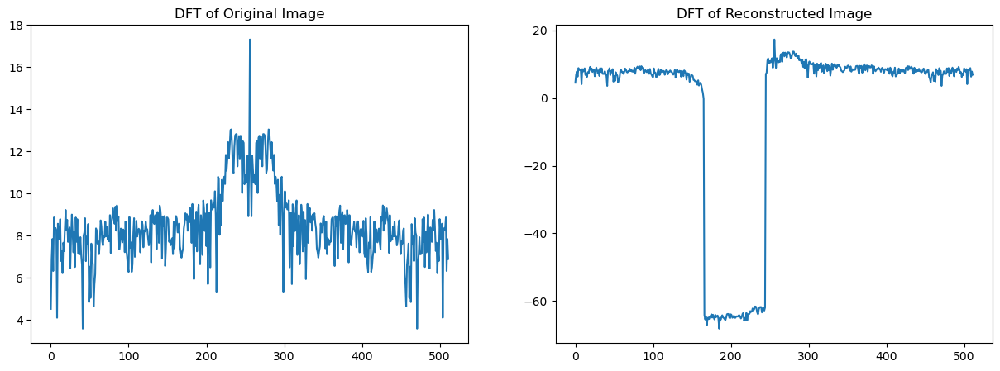

In [83]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.log(np.abs( np.diag(image_dft) )));
ax[0].set_title("DFT of Original Image");

ax[1].plot(np.log(np.abs( np.diag(recon_dft) )));
ax[1].set_title("DFT of Reconstructed Image");

LEFT PLOT: On the right side the dropoff is due to the Complex Steerable Pyramid only masking a single lobe in frequency space, as opposed to the regular pyramid that is able to mask both lobes (180 degrees off from eachother). The high region on the left is from the hi pass filter and the high region in the middle is from the low pass filter.

In [84]:
recon = np.fft.ifft2(np.fft.ifftshift(recon_dft)).real

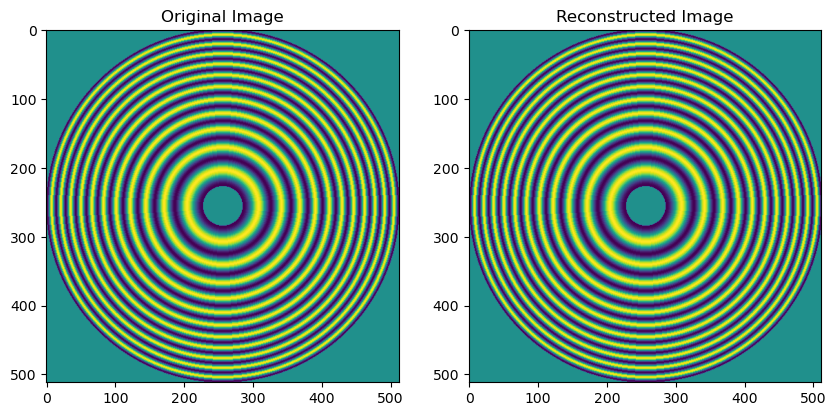

In [85]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(image);
ax[0].set_title("Original Image");

ax[1].imshow(recon);
ax[1].set_title("Reconstructed Image");

Check the differences

In [86]:
np.sum(np.abs(recon - image)), np.mean(np.square(recon - image))

(7.874821239539642e-09, 1.5815154470611668e-27)

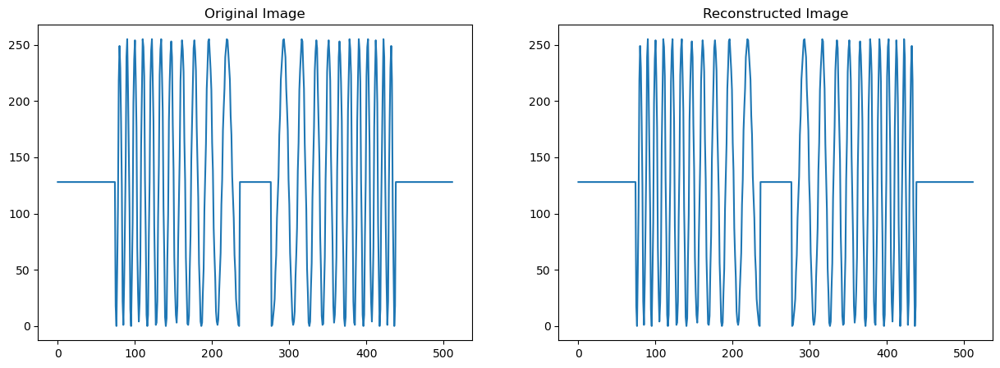

In [87]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.diag(image));
ax[0].set_title("Original Image");

ax[1].plot(np.diag(recon))
ax[1].set_title("Reconstructed Image");